In [2]:
from datetime import datetime
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import pandas as pd
import numpy as np
import re
from tqdm import tqdm
from sklearn import preprocessing
from pandas.tseries.offsets import DateOffset

In [3]:
matplotlib.rc_file_defaults()
from matplotlib import rcParams

# figure size in inches
rcParams['figure.figsize'] = 10,6

In [4]:
countries_of_interest = ['IN', 'JP', 'CN', 'ID', 'LA', 'MM', 'BN', 'KH', 'TL', 'MY', 'SG', 'PH', 'TH', 'VN' ]
aggregated_dfs = dict.fromkeys(countries_of_interest)

for country in countries_of_interest:
    tmp = pd.read_json('c4_reuters_{}_features_extracted.json'.format(country)).reset_index(drop = True)
    tmp['total articles'] = 1
    tmp['negative articles'] = tmp['SA tag'].map({'POSITIVE': 0, 'NEGATIVE': 1})
    tmp['positive articles'] = tmp['SA tag'].map({'POSITIVE': 1, 'NEGATIVE': 0})
    tmp['timestamp'] = pd.to_datetime(tmp['timestamp'])
    
    
    tmp=tmp.groupby(['news tag', pd.Grouper(key = 'timestamp', freq = '1D')]).sum()
    tmp['Sentiment Index'] = tmp['negative articles'] / tmp['total articles']
    tmp['Sentiment Index'].fillna(0)
    aggregated_dfs[country] = tmp

In [5]:
aggregated_dfs['IN'].index.get_level_values(0).unique()

Index(['Business', 'Sci/Tech', 'Sports', 'World'], dtype='object', name='news tag')

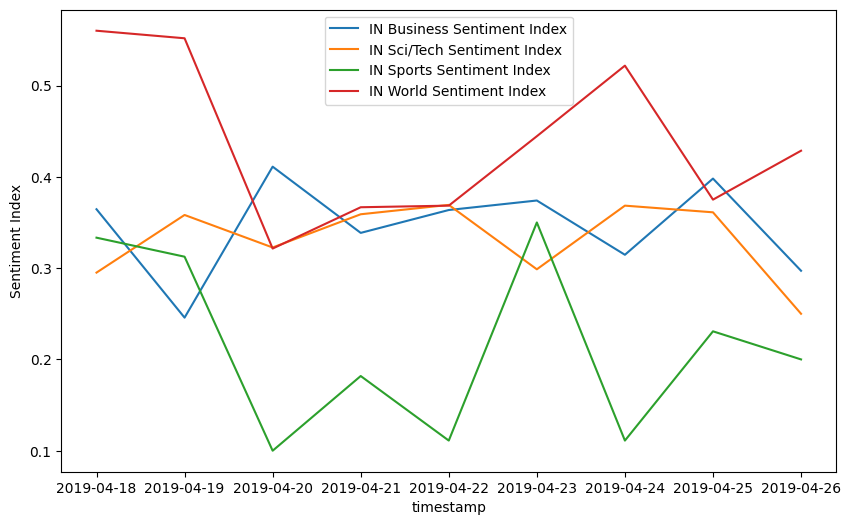

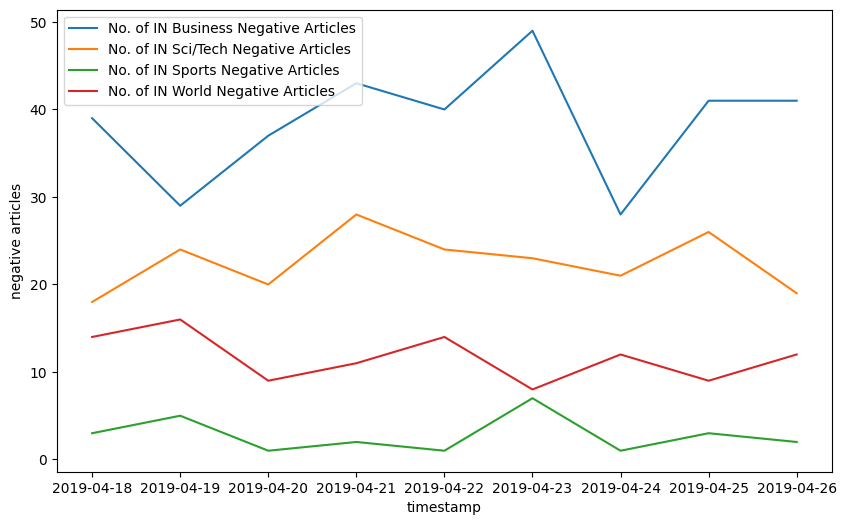

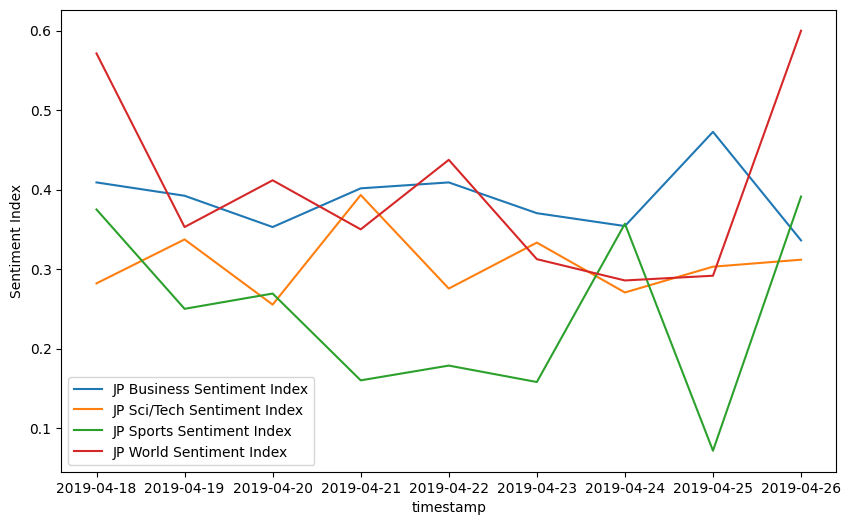

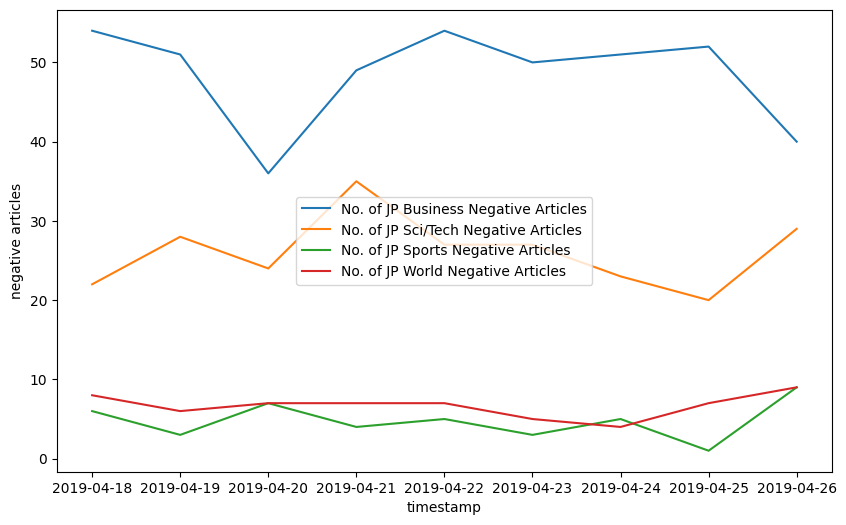

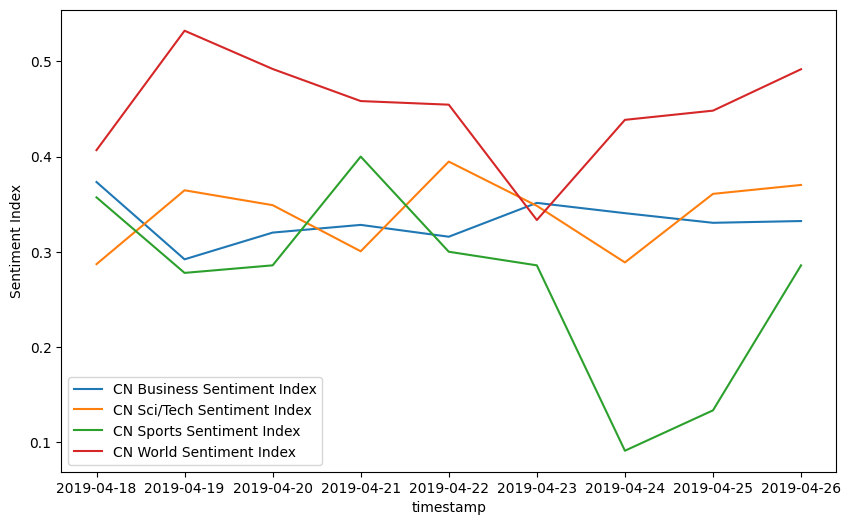

...

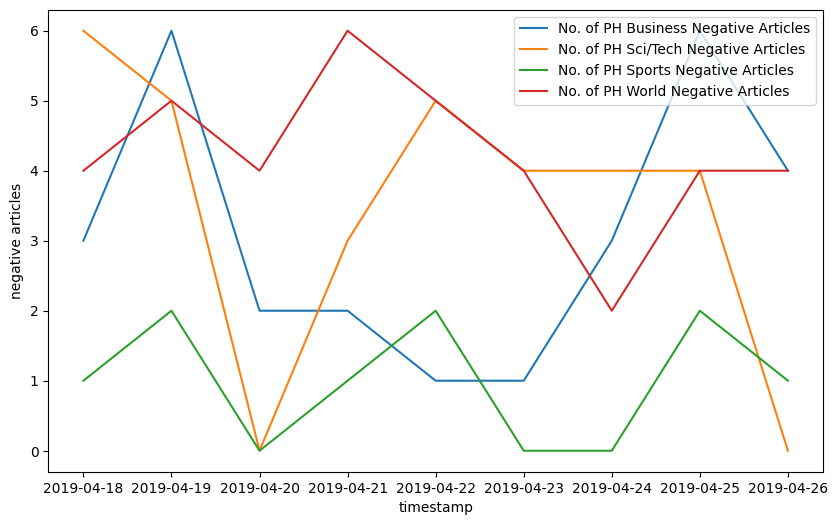

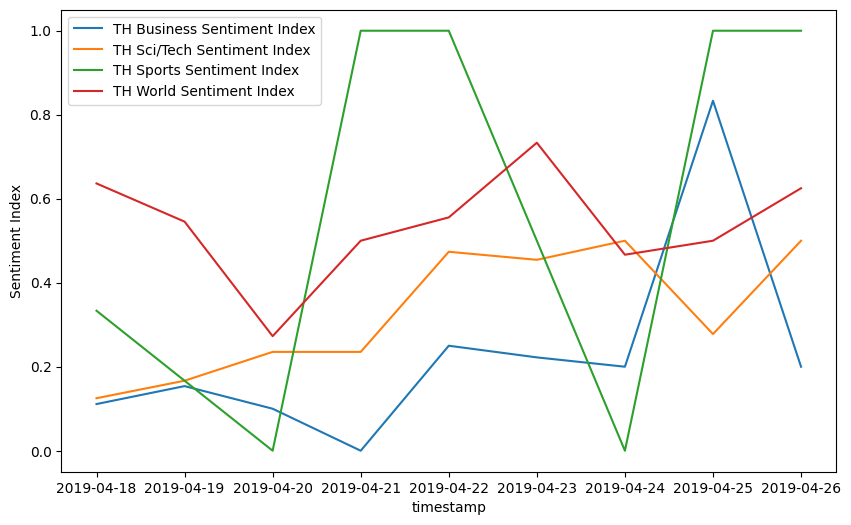

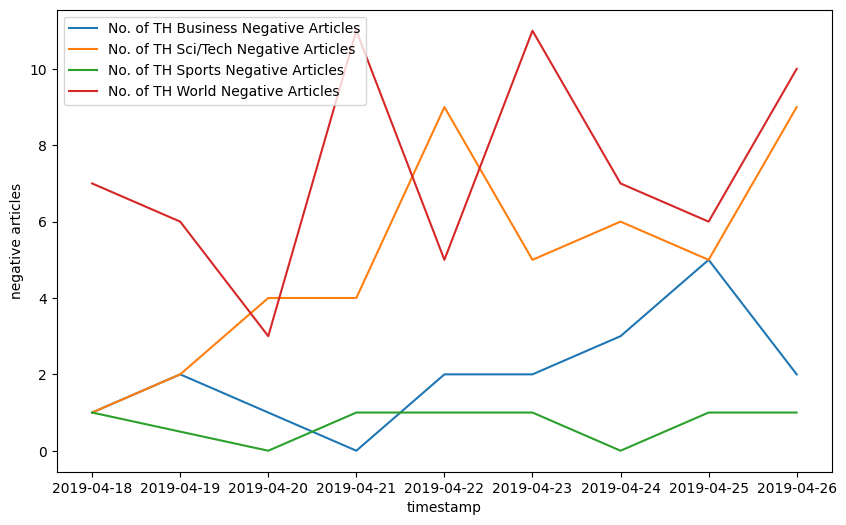

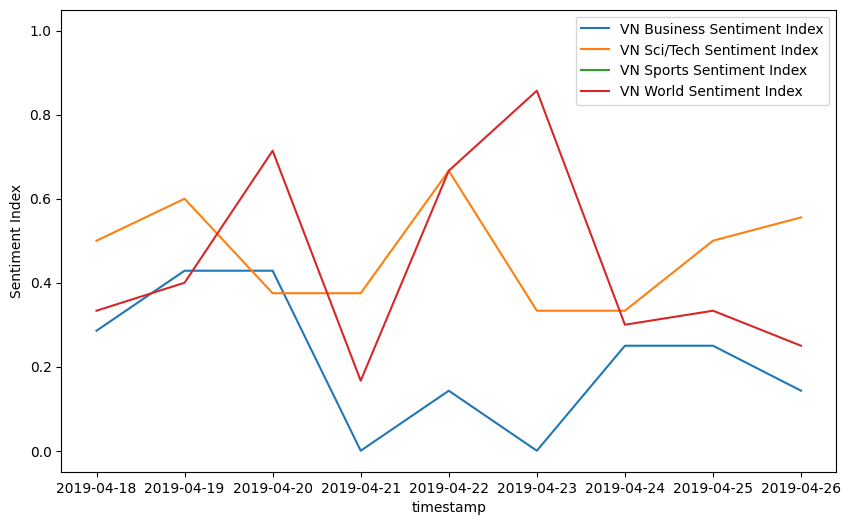

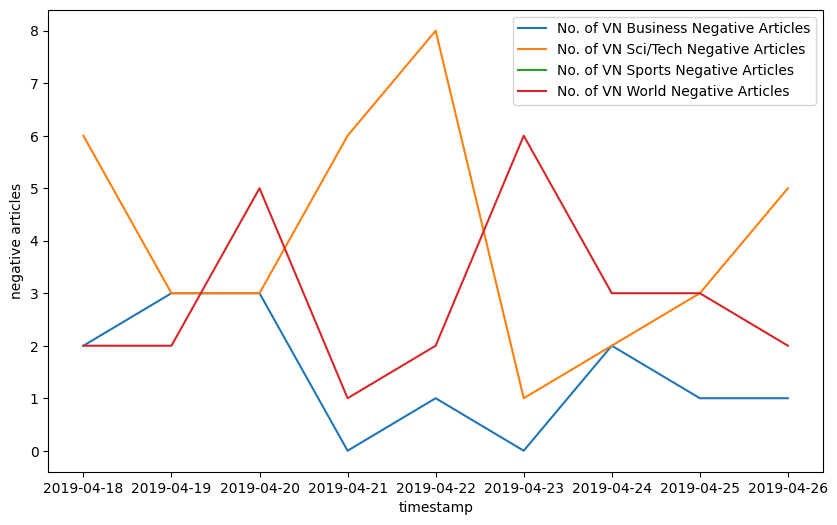

In [6]:
for key in aggregated_dfs:
    for category in aggregated_dfs[key].index.get_level_values(0).unique():
        sns.lineplot(data=aggregated_dfs[key].loc[category], x = aggregated_dfs[key].loc[category].index, y = 'Sentiment Index', label = '{} {} Sentiment Index'.format(key, category))
    plt.show()
    for category in aggregated_dfs[key].index.get_level_values(0).unique():
        sns.lineplot(data=aggregated_dfs[key].loc[category], x = aggregated_dfs[key].loc[category].index, y = 'negative articles', label = 'No. of {} {} Negative Articles'.format(key, category))
    plt.show()

In [7]:
acled_new = pd.read_csv('2018-07-30-2021-08-23.csv')

In [33]:
acled_new['event_type'].value_counts()

Protests                      341229
Battles                       125253
Explosions/Remote violence     87925
Violence against civilians     75012
Riots                          46961
Strategic developments         33938
Name: event_type, dtype: int64

In [8]:
acled_new.columns

Index(['data_id', 'iso', 'event_id_cnty', 'event_id_no_cnty', 'event_date',
       'year', 'time_precision', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'region', 'country', 'admin1', 'admin2', 'admin3',
       'location', 'latitude', 'longitude', 'geo_precision', 'source',
       'source_scale', 'notes', 'fatalities', 'timestamp', 'iso3'],
      dtype='object')

In [9]:
acled_new['year'].value_counts()

2020    251710
2019    215961
2021    160629
2018     82018
Name: year, dtype: int64

In [10]:
country_names = {
    'IN': 'India',
    'JP': 'Japan',
    'CN': 'China',
    'ID': 'Indonesia',
    'LA': 'Laos',
    'MM': 'Myanmar',
    'BN': 'Brunei',
    'KH': 'Cambodia',
    'TL': 'Timor-Leste',
    'MY': 'Malaysia',
    'SG': 'Singapore',
    'PH': 'Philippines',
    'TH': 'Thailand',
    'VN': 'Vietnam'
}

In [11]:
acled_dfs = dict.fromkeys(countries_of_interest)

for country in countries_of_interest:
    tmp = acled_new[acled_new['country'] == country_names[country]]
    tmp['event_date'] = pd.to_datetime(tmp['event_date'].astype(str))
    tmp = tmp[(tmp['event_type'] == 'Protests') | (tmp['event_type'] == 'Riots')]
    tmp = tmp.groupby(pd.Grouper(key = 'event_date', freq = 'D')).count()
    tmp = tmp[['actor1']]
    tmp.columns = ['y']
    acled_dfs[country] = tmp

/tmp/ipykernel_6961/1151032935.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['event_date'] = pd.to_datetime(tmp['event_date'].astype(str))


In [22]:
acled_offset_1_dfs = dict.fromkeys(countries_of_interest)
protests_offset_1_dfs = dict.fromkeys(countries_of_interest)
riots_offset_1_dfs = dict.fromkeys(countries_of_interest)


for country in countries_of_interest:
    tmp = acled_new[acled_new['country'] == country_names[country]]
    tmp['event_date'] = pd.to_datetime(tmp['event_date'].astype(str)) - DateOffset(days = 1)

    demonstrations = tmp[(tmp['event_type'] == 'Protests') | (tmp['event_type'] == 'Riots')]
    demonstrations = demonstrations.groupby(pd.Grouper(key = 'event_date', freq = 'D')).count()
    demonstrations = demonstrations[['actor1']]
    demonstrations.columns = ['y']
    acled_offset_1_dfs[country] = demonstrations

    protests = tmp[(tmp['event_type'] == 'Protests')]
    protests = protests.groupby(pd.Grouper(key = 'event_date', freq = 'D')).count()
    protests = protests[['actor1']]
    protests.columns = ['y']
    protests_offset_1_dfs[country] = protests

    riots = tmp[(tmp['event_type'] == 'Riots')]
    riots = riots.groupby(pd.Grouper(key = 'event_date', freq = 'D')).count()
    riots = riots[['actor1']]
    riots.columns = ['y']
    riots_offset_1_dfs[country] = riots


/tmp/ipykernel_6961/727401826.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['event_date'] = pd.to_datetime(tmp['event_date'].astype(str)) - DateOffset(days = 1)


# Visualisation of Sentiments and Corr Score

In [13]:
data_visualisation_dfs = dict.fromkeys(countries_of_interest)
news_tag = ['World', 'Business', 'Sci/Tech', 'Sports']

for key in countries_of_interest:
    tmp_dict = dict.fromkeys(news_tag)
    for tag in news_tag:
        try:
            tmp = (pd.merge(aggregated_dfs[key].loc[tag].asfreq('D'), acled_dfs[key].asfreq('D'), left_index=True, right_index=True)).fillna(0)
        except KeyError:
            tmp = None
        tmp_dict[tag] = tmp
    data_visualisation_dfs[key] = tmp_dict

In [27]:
# Calculation of next day correlation coefficients

data_visualisation_offset_1_dfs = dict.fromkeys(countries_of_interest)
news_tag = ['World', 'Business', 'Sci/Tech', 'Sports']
demonstrations_correlation_coeff = dict.fromkeys(countries_of_interest)
protests_correlation_coeff = dict.fromkeys(countries_of_interest)
riots_correlation_coeff = dict.fromkeys(countries_of_interest)


for key in countries_of_interest:
    tmp_dict = dict.fromkeys(news_tag)
    demonstrations_corr_tmp_dict = dict.fromkeys(news_tag)
    protests_corr_tmp_dict = dict.fromkeys(news_tag)
    riots_corr_tmp_dict = dict.fromkeys(news_tag)

    for tag in news_tag:
        try:
            tmp = (pd.merge(aggregated_dfs[key].loc[tag].asfreq('D'), acled_offset_1_dfs[key].asfreq('D'), left_index=True, right_index=True)).fillna(0)
            correlation = tmp['y'].corr(tmp['Sentiment Index'])

            tmp1 = (pd.merge(aggregated_dfs[key].loc[tag].asfreq('D'), protests_offset_1_dfs[key].asfreq('D'), left_index=True, right_index=True)).fillna(0)
            correlation1 = tmp1['y'].corr(tmp1['Sentiment Index'])

            tmp2 = (pd.merge(aggregated_dfs[key].loc[tag].asfreq('D'), riots_offset_1_dfs[key].asfreq('D'), left_index=True, right_index=True)).fillna(0)
            correlation2 = tmp2['y'].corr(tmp2['Sentiment Index'])
        except KeyError:
            tmp = None
            correlation, correlation1, correlation2 = None, None, None
        demonstrations_corr_tmp_dict[tag] = correlation
        protests_corr_tmp_dict[tag] = correlation1
        riots_corr_tmp_dict[tag] = correlation2

        tmp_dict[tag] = tmp
    data_visualisation_offset_1_dfs[key] = tmp_dict
    demonstrations_correlation_coeff[key] = demonstrations_corr_tmp_dict
    protests_correlation_coeff[key] = protests_corr_tmp_dict
    riots_correlation_coeff[key] = riots_corr_tmp_dict


/home/bash/news_dataset/clavin/lib/python3.8/site-packages/numpy/lib/function_base.py:2683: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/bash/news_dataset/clavin/lib/python3.8/site-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


In [28]:
demonstration_corr_df = pd.DataFrame(data = demonstrations_correlation_coeff)
protests_corr_df = pd.DataFrame(data = protests_correlation_coeff)
riots_corr_df = pd.DataFrame(data = riots_correlation_coeff)

In [30]:
demonstration_corr_df.head()

,IN,JP,CN,ID,LA,MM,BN,KH,TL,MY,SG,PH,TH,VN
World,-0.528095,0.524720,-0.452653,-0.742815,NaN,-0.208901,NaN,-0.034292,NaN,-0.143182,NaN,-0.287573,0.347831,NaN
Business,0.473105,-0.384454,0.322203,0.061052,NaN,-0.654654,NaN,-0.357143,NaN,-0.469162,NaN,-0.384755,0.706987,NaN
Sci/Tech,-0.045887,0.171669,0.130050,0.139996,NaN,0.145045,NaN,-0.056888,NaN,-0.021326,NaN,-0.180533,0.136156,NaN
Sports,-0.305174,0.399213,0.085127,-0.321083,NaN,NaN,NaN,NaN,NaN,-0.466252,NaN,-0.044241,0.257019,NaN


In [29]:
protests_corr_df

,IN,JP,CN,ID,LA,MM,BN,KH,TL,MY,SG,PH,TH,VN
World,-0.137936,0.524720,-0.474334,-0.720450,NaN,0.003688,NaN,0.143478,NaN,-0.380912,NaN,-0.287573,0.347831,NaN
Business,0.098963,-0.384454,0.384620,0.135040,NaN,-0.462910,NaN,-0.236228,NaN,-0.395522,NaN,-0.384755,0.706987,NaN
Sci/Tech,-0.043355,0.171669,0.010788,0.005747,NaN,-0.306196,NaN,0.260694,NaN,-0.082513,NaN,-0.180533,0.136156,NaN
Sports,0.195732,0.399213,0.157607,-0.587675,NaN,NaN,NaN,NaN,NaN,-0.368605,NaN,-0.044241,0.257019,NaN


In [31]:
riots_corr_df

,IN,JP,CN,ID,LA,MM,BN,KH,TL,MY,SG,PH,TH,VN
World,-0.608941,NaN,0.007414,-0.174366,NaN,-0.336133,NaN,-0.188842,NaN,0.344978,NaN,NaN,NaN,NaN
Business,0.562290,NaN,-0.210081,-0.098138,NaN,-0.292770,NaN,-0.236228,NaN,-0.148527,NaN,NaN,NaN,NaN
Sci/Tech,-0.031553,NaN,0.544873,0.225733,NaN,0.713475,NaN,-0.335178,NaN,0.090051,NaN,NaN,NaN,NaN
Sports,-0.539439,NaN,-0.299557,0.334388,NaN,NaN,NaN,NaN,NaN,-0.184302,NaN,NaN,NaN,NaN


In [17]:
type(data_visualisation_dfs['MM']['Sports'])

NoneType

In [18]:
aggregated_dfs['BN'].loc['Sports']

,news tag confidence,SA tag confidence,total articles,negative articles,positive articles,Sentiment Index
timestamp,,,,,,
2019-04-21,0.969862,0.998433,1,0,1,0.0


In [19]:
data_visualisation_dfs['JP']['World'].head()

,news tag confidence,SA tag confidence,total articles,negative articles,positive articles,Sentiment Index,y
2019-04-18,11.438670,13.865567,14,8,6,0.571429,1
2019-04-19,14.188402,16.862842,17,6,11,0.352941,2
2019-04-20,14.644478,16.495995,17,7,10,0.411765,3
2019-04-21,16.344100,19.269671,20,7,13,0.350000,1
2019-04-22,12.690565,15.895275,16,7,9,0.437500,2


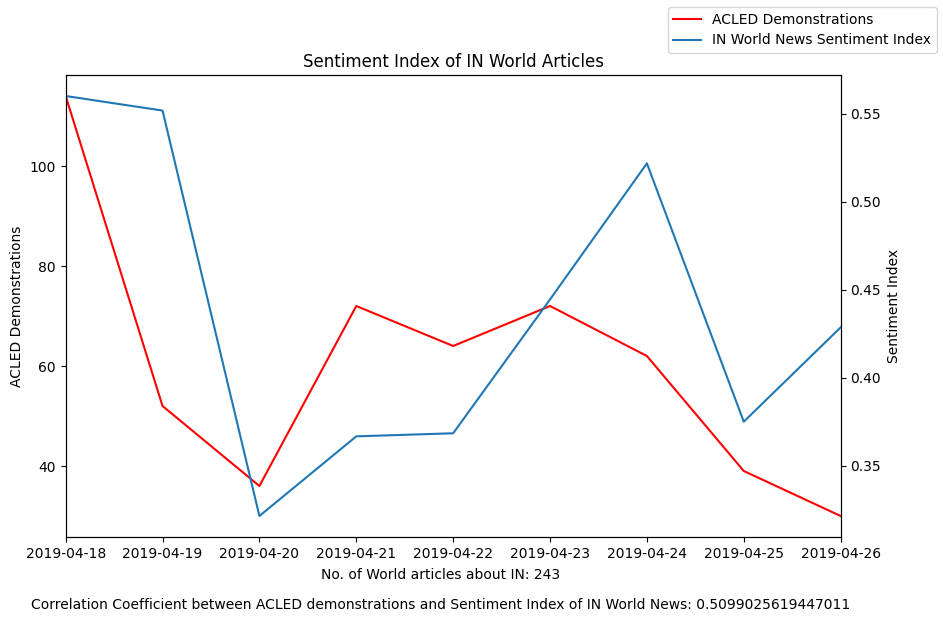

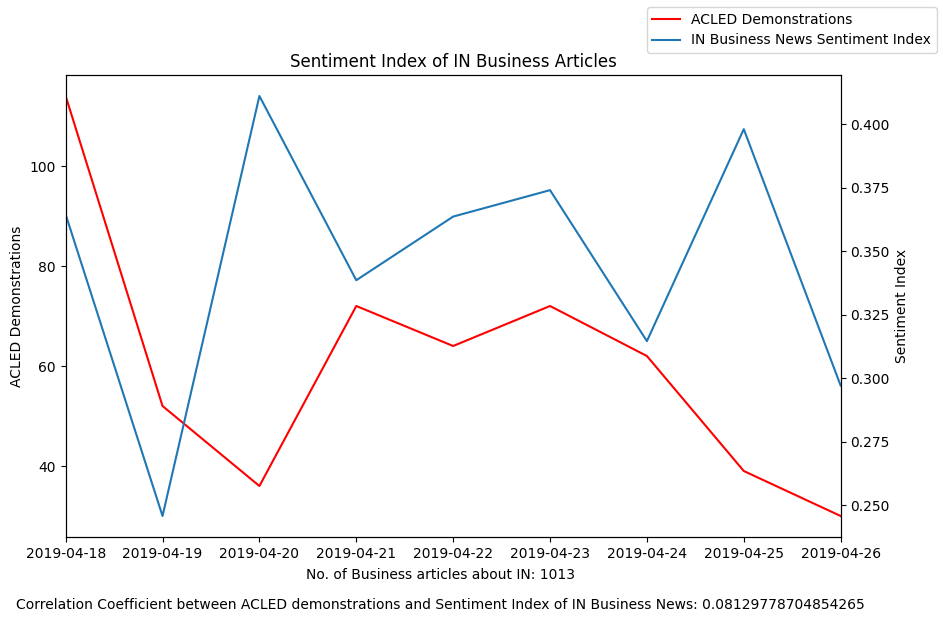

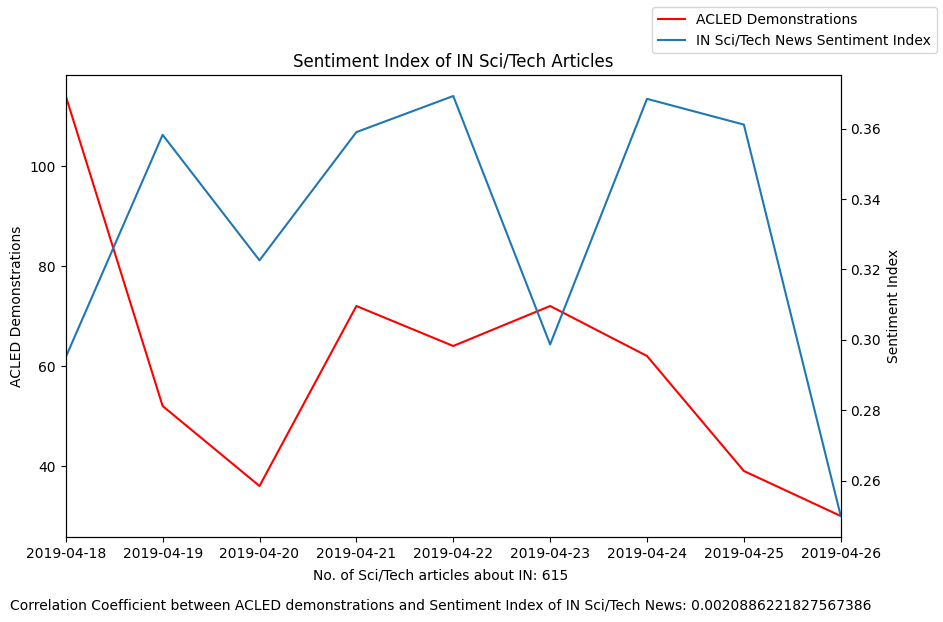

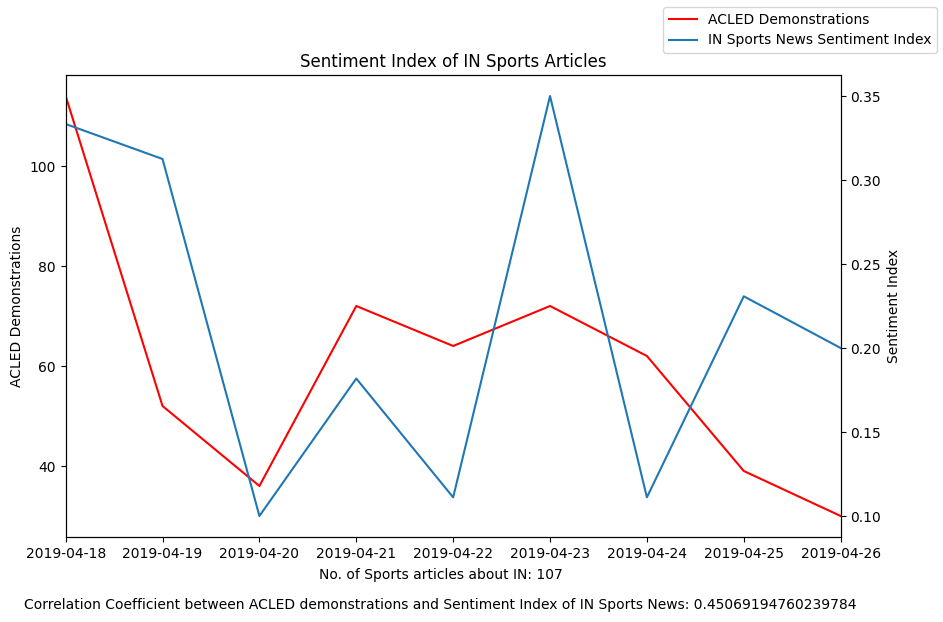

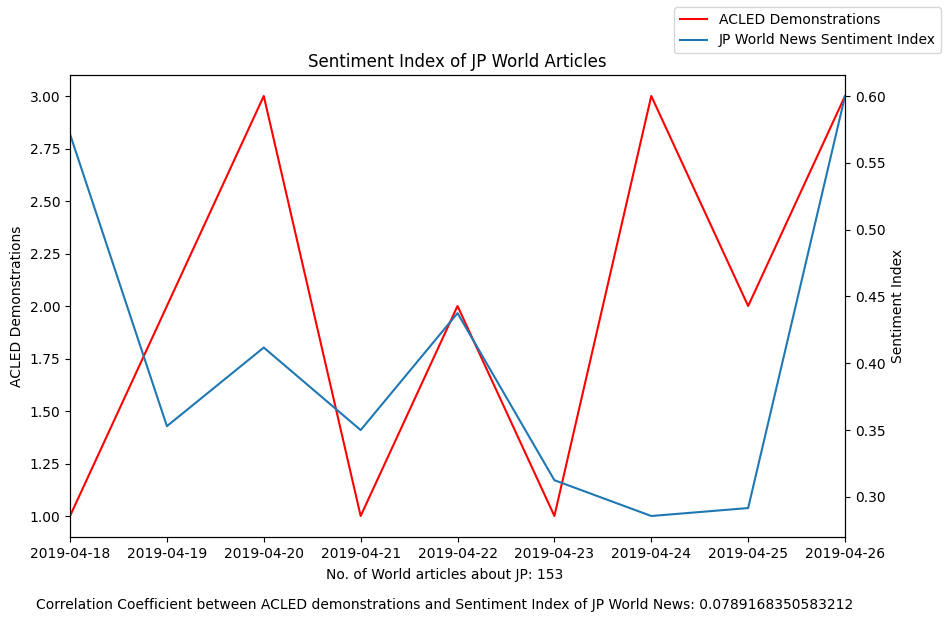

...

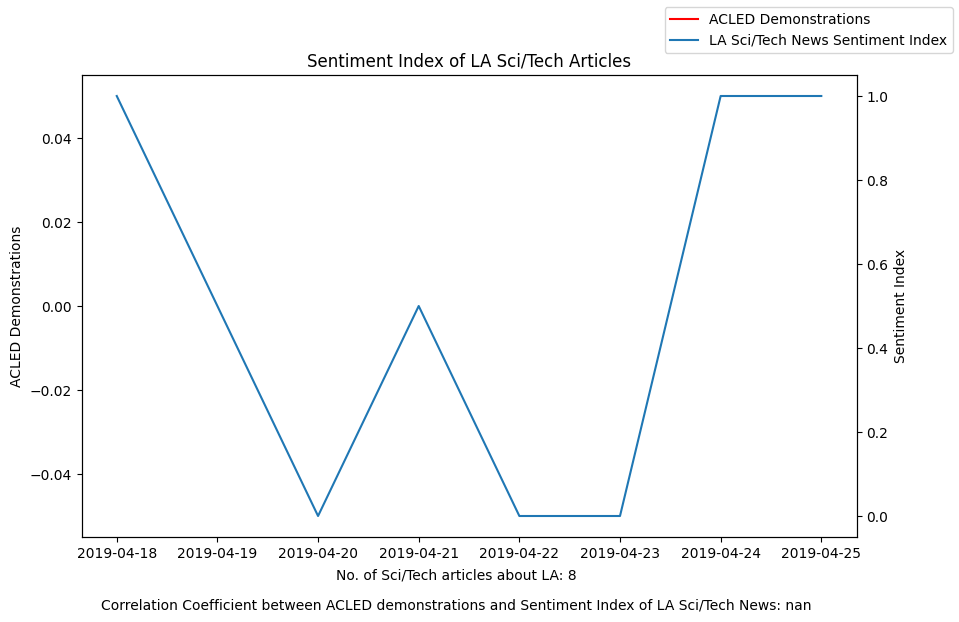

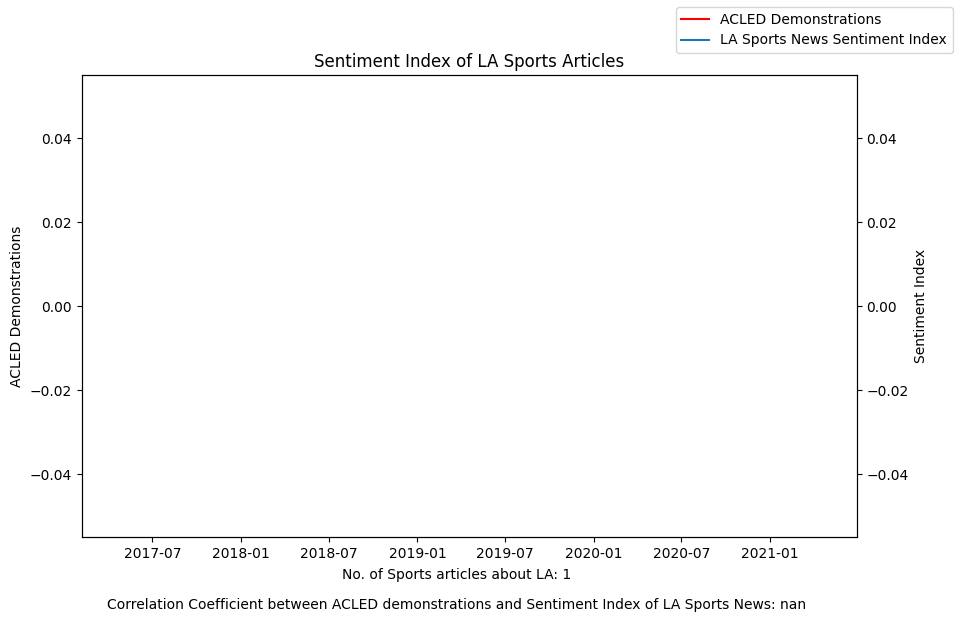

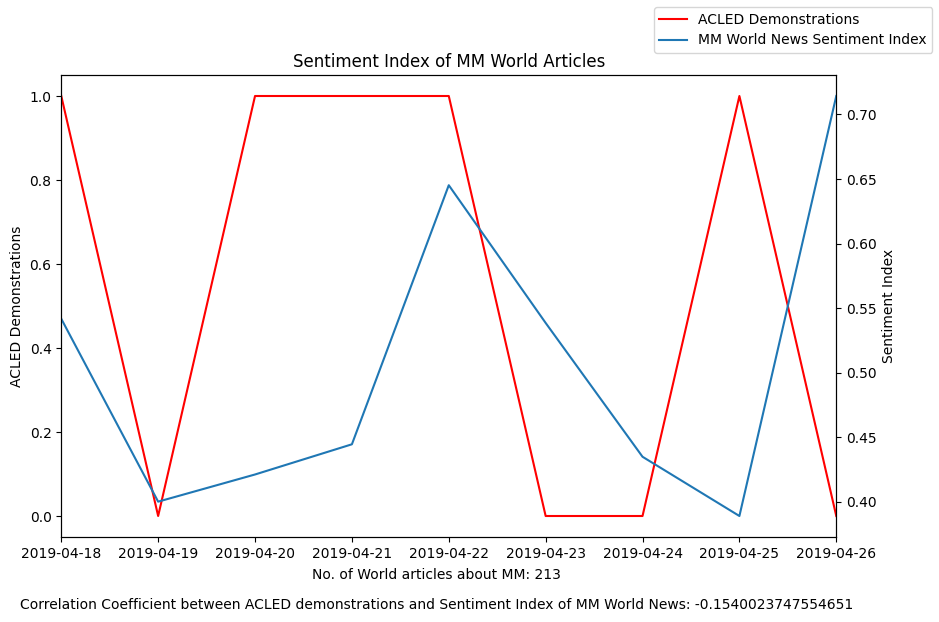

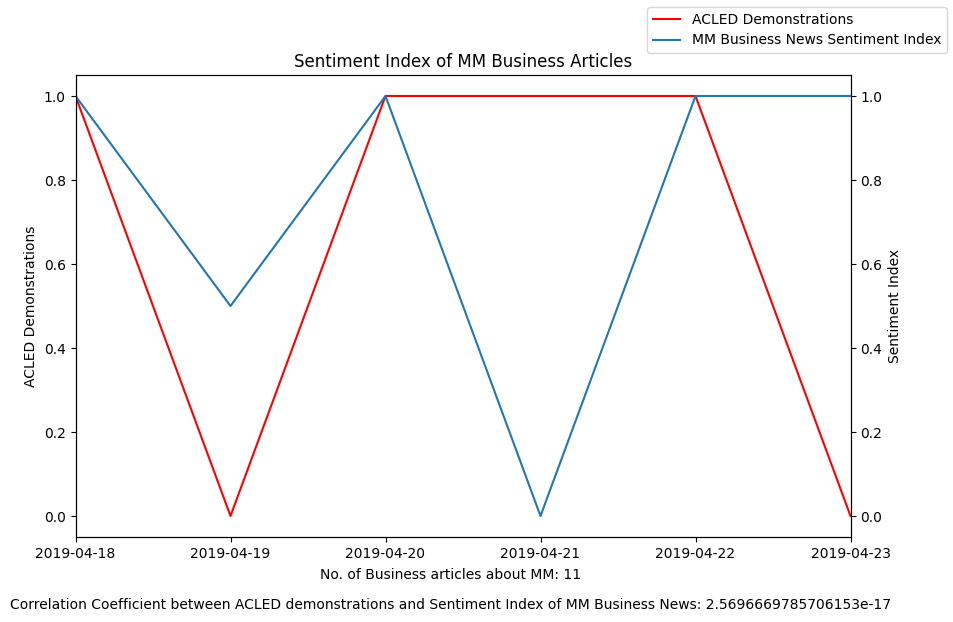

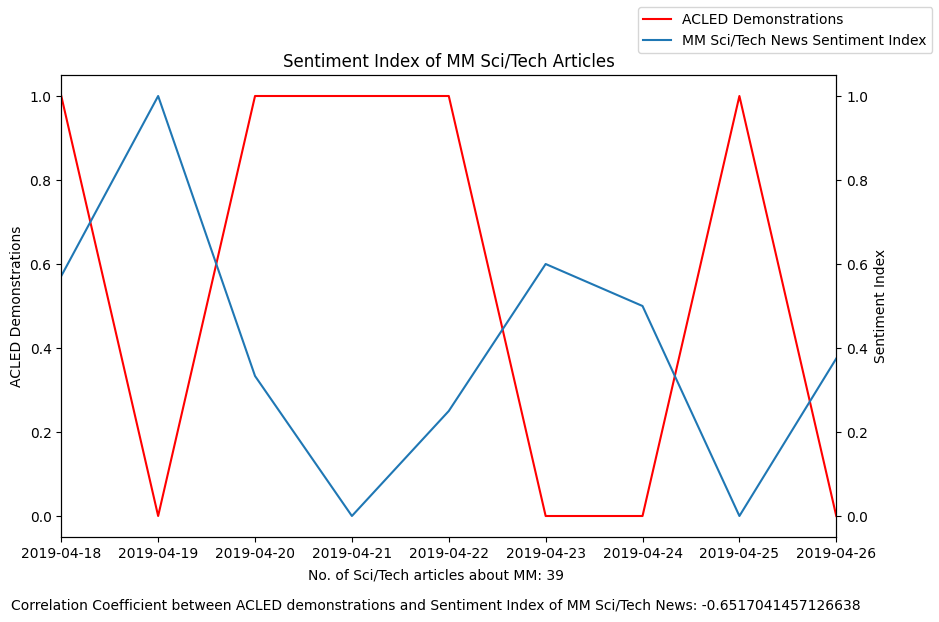

No Sports articles published for MM


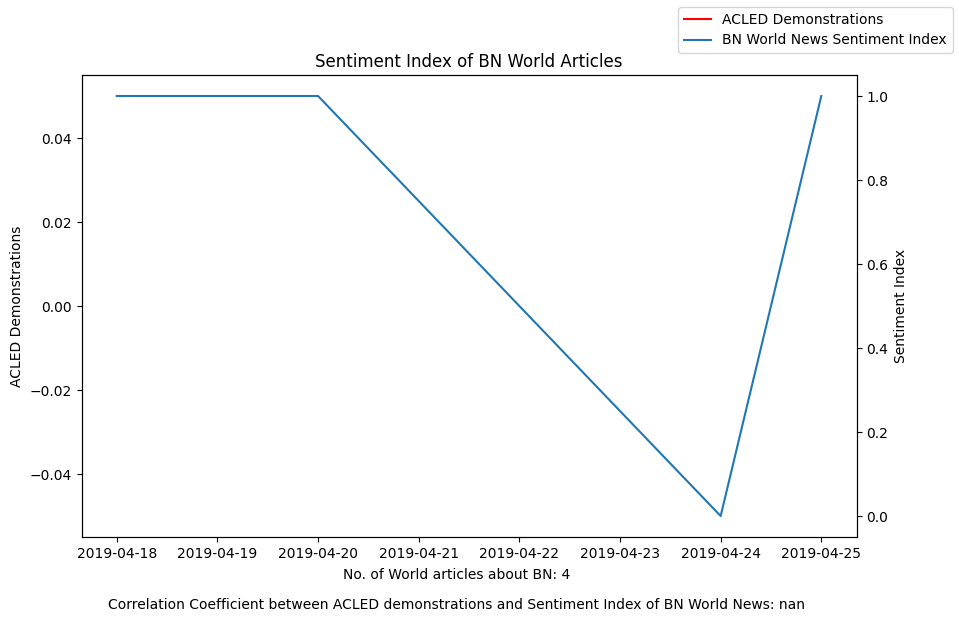

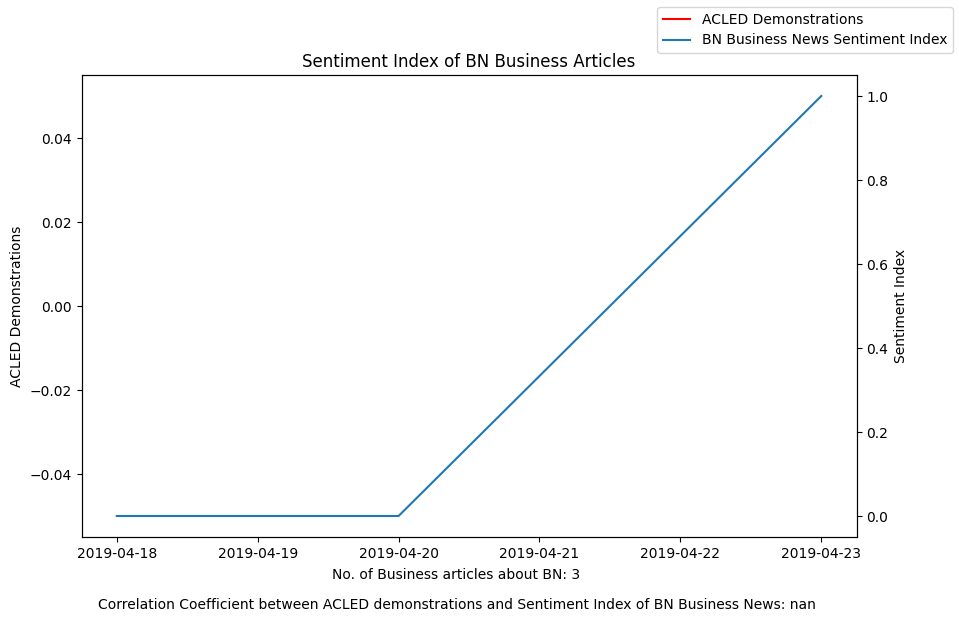

No Sci/Tech articles published for BN


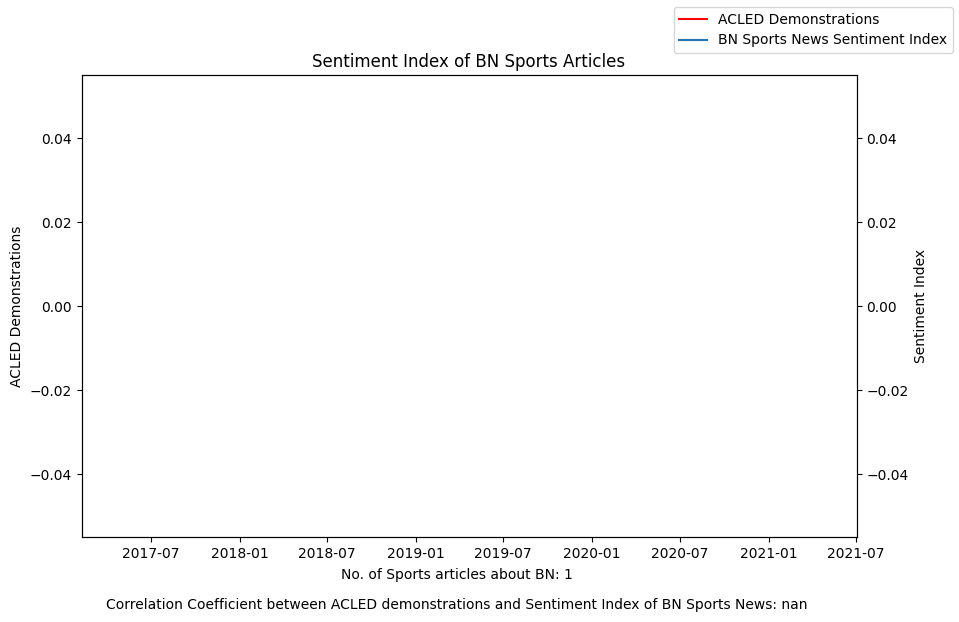

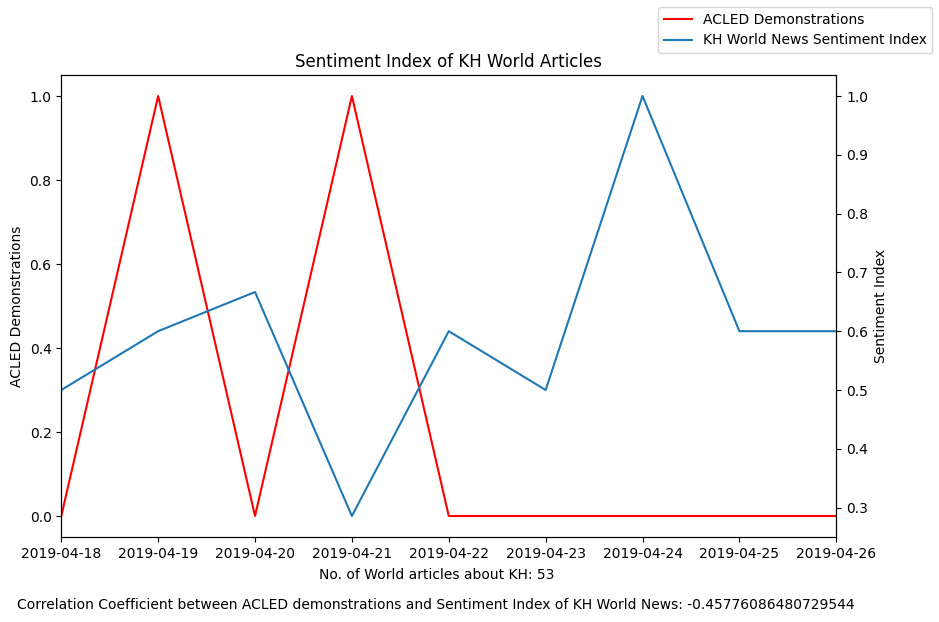

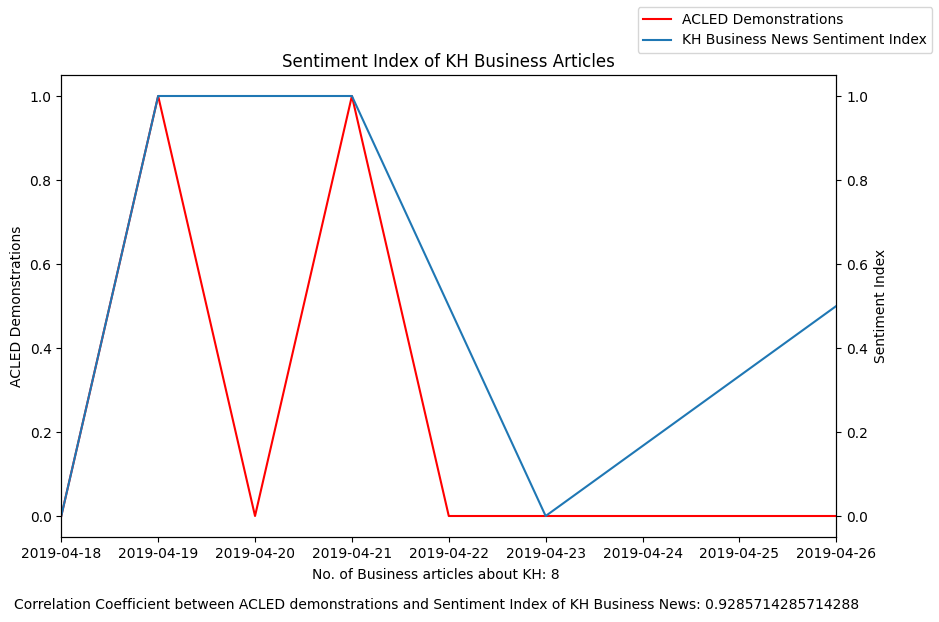

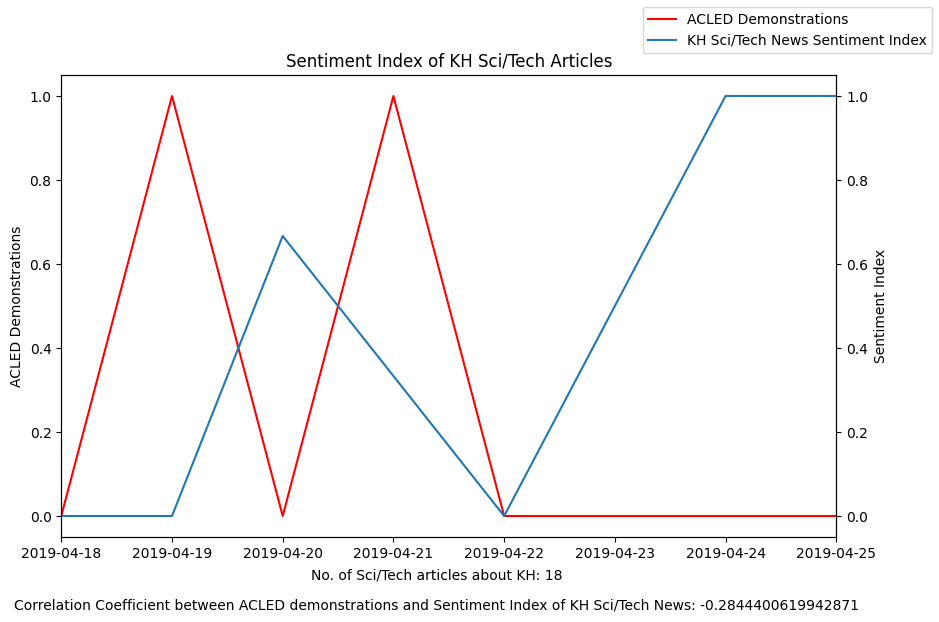

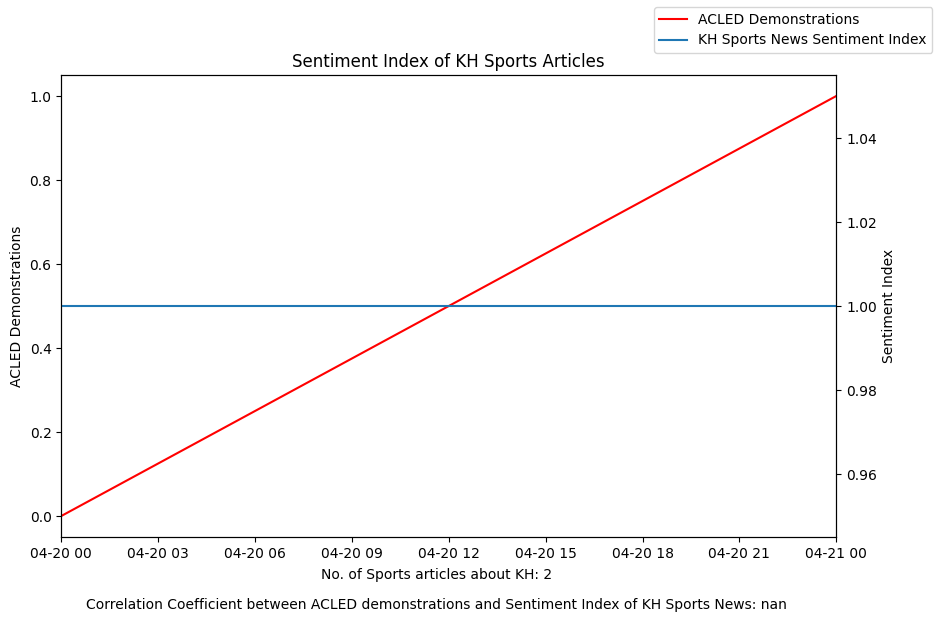

...

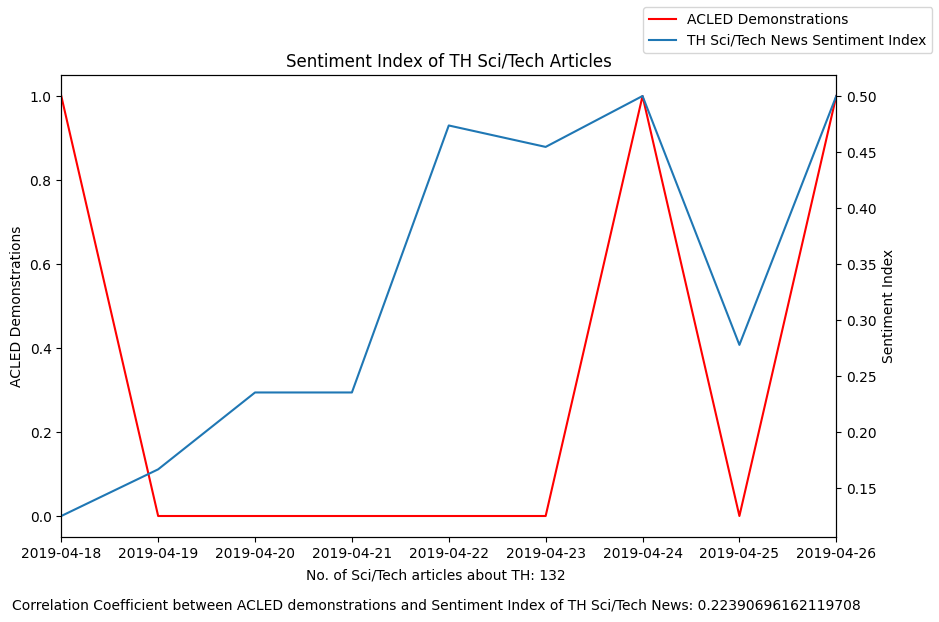

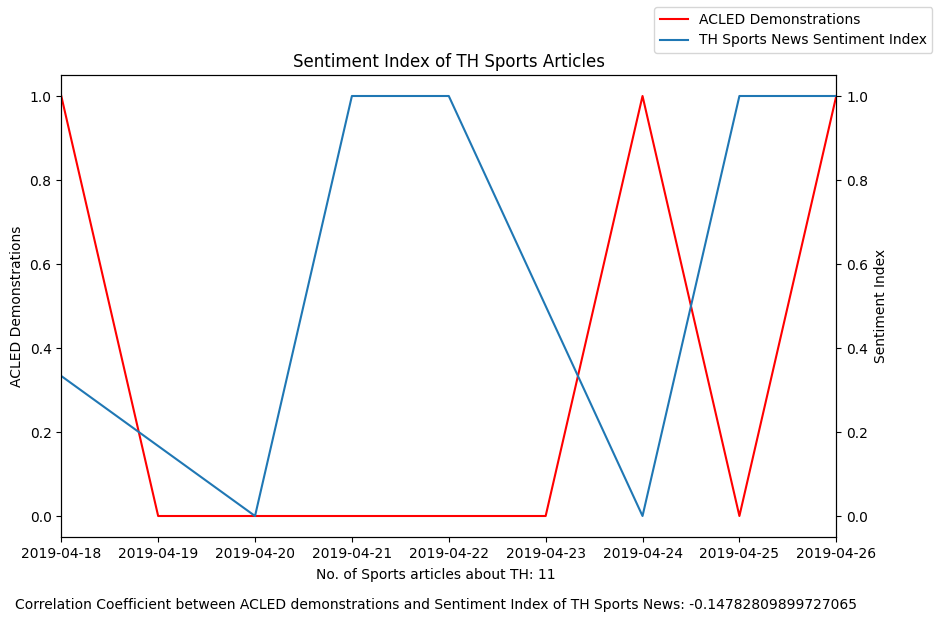

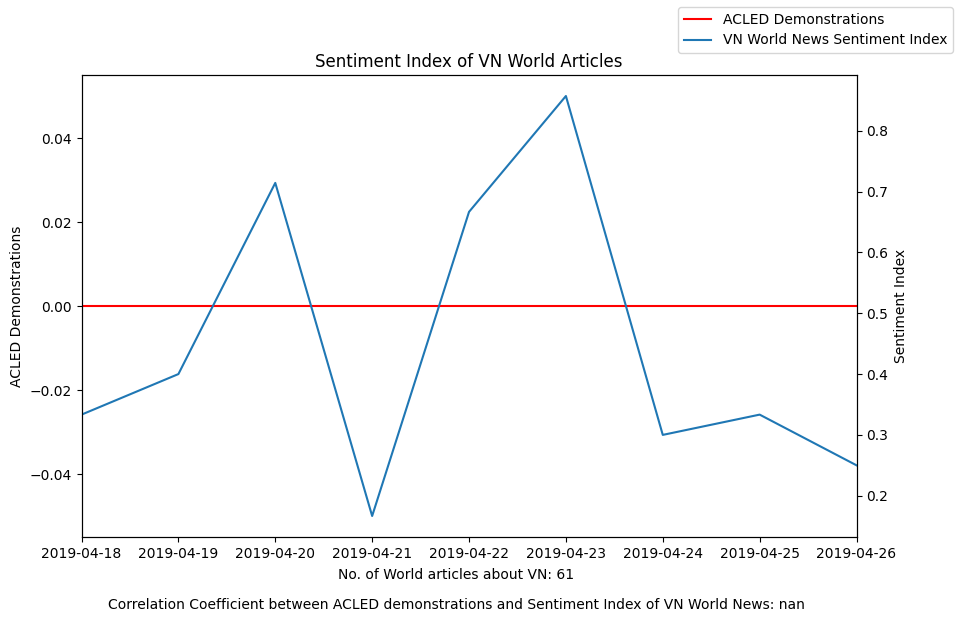

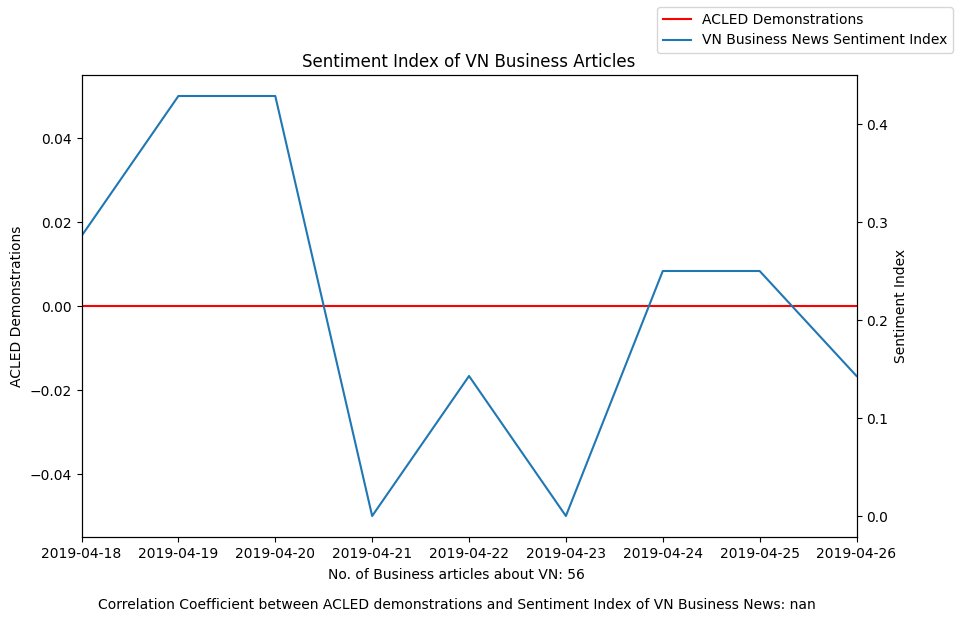

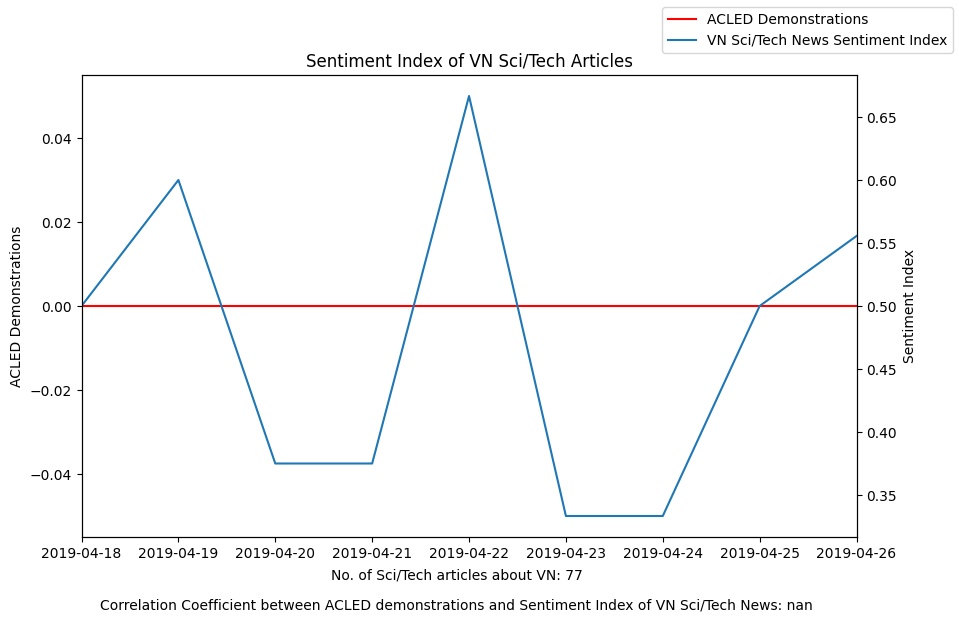

/home/bash/news_dataset/clavin/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1200: UserWarning: Attempting to set identical left == right == 18006.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/bash/news_dataset/clavin/lib/python3.8/site-packages/numpy/lib/function_base.py:2683: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/bash/news_dataset/clavin/lib/python3.8/site-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


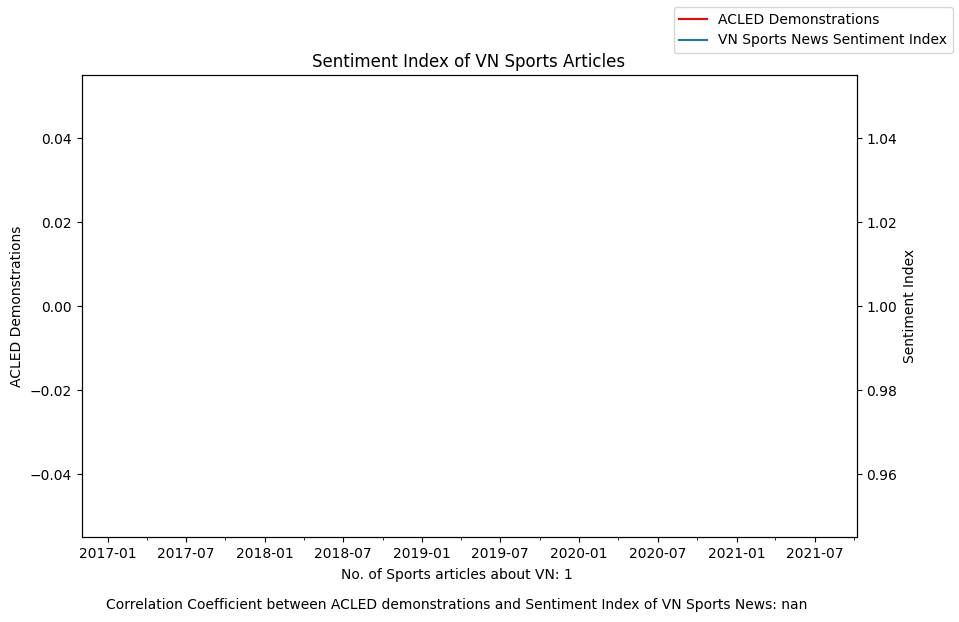

In [20]:
for key in data_visualisation_dfs:
    for tag in news_tag:
        try:
            ax = data_visualisation_dfs[key][tag].plot(y='y', color = 'r', label = 'ACLED Demonstrations', legend = False, figsize = [10,6])
            plt.ylabel('ACLED Demonstrations')

            ax2=ax.twinx()
            plt.plot(aggregated_dfs[key].loc[tag].index,aggregated_dfs[key].loc[tag]['Sentiment Index'],label = '{} {} News Sentiment Index'.format(key, tag))
            txt = "Correlation Coefficient between ACLED demonstrations and Sentiment Index of {} {} News: {}".format(key, tag, data_visualisation_dfs[key][tag]['y'].corr(data_visualisation_dfs[key][tag]['Sentiment Index']))
            txt1 = "No. of {} articles about {}: {}".format(tag, key, aggregated_dfs[key].loc[tag]['total articles'].sum())
            plt.ylabel('Sentiment Index')

            ax.figure.legend()
            plt.title('Sentiment Index of {} {} Articles'.format(key, tag))
            plt.figtext(0.5, -.01,txt, ha = 'center')
            plt.figtext(0.5, 0.04 ,txt1, ha = 'center')
            plt.grid(False)
            plt.show()
        except AttributeError:
            print("No {} articles published for {}".format(tag, key))

In [21]:
# Calculating Correlation Coefficients